Problem statement: To build a CNN based model which can accurately detect melanoma. Melanoma is a type of cancer that can be deadly if not detected early. It accounts for 75% of skin cancer deaths. A solution which can evaluate images and alert the dermatologists about the presence of melanoma has the potential to reduce a lot of manual effort needed in diagnosis.

### Importing Skin Cancer Data
#### To do: Take necessary actions to read the data

In [ ]:
pip install Augmentor

### Importing all the important libraries

In [ ]:
import pathlib
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import PIL
from glob import glob
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from tensorflow.python.keras.layers import Dense, Dropout, Activation, Flatten, Conv2D, MaxPool2D

from tensorflow.keras.layers import BatchNormalization
import Augmentor




In [ ]:
## If you are using the data by mounting the google drive, use the following :
from google.colab import drive
drive.mount('/content/gdrive')

##Ref:https://towardsdatascience.com/downloading-datasets-into-google-drive-via-google-colab-bcb1b30b0166

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


This assignment uses a dataset of about 2357 images of skin cancer types. The dataset contains 9 sub-directories in each train and test subdirectories. The 9 sub-directories contains the images of 9 skin cancer types respectively.

In [ ]:
# Defining the path for train and test images
## Todo: Update the paths of the train and test dataset

generic_path = '/content/gdrive/MyDrive/data/CNN_assignment/ISIC'
data_dir_train = pathlib.Path(generic_path + '/Train')
data_dir_test = pathlib.Path(generic_path + '/Test')

In [ ]:
image_count_train = len(list(data_dir_train.glob('*/*.jpg')))
print(image_count_train)
image_count_test = len(list(data_dir_test.glob('*/*.jpg')))
print(image_count_test)

2239
118


### Load using keras.preprocessing

Let's load these images off disk using the helpful image_dataset_from_directory utility.

### Create a dataset

Define some parameters for the loader:

In [ ]:
batch_size = 32
img_height = 180
img_width = 180

Use 80% of the images for training, and 20% for validation.

In [ ]:
## Write your train dataset here
## Note use seed=123 while creating your dataset using tf.keras.preprocessing.image_dataset_from_directory
## Note, make sure your resize your images to the size img_height*img_width, while writting the dataset
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir_train,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  label_mode='categorical',
  batch_size=batch_size)

Found 2239 files belonging to 9 classes.
Using 1792 files for training.


In [ ]:
## Write your validation dataset here
## Note use seed=123 while creating your dataset using tf.keras.preprocessing.image_dataset_from_directory
## Note, make sure your resize your images to the size img_height*img_width, while writting the dataset
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir_train,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  label_mode='categorical',
  batch_size=batch_size)

Found 2239 files belonging to 9 classes.
Using 447 files for validation.


In [ ]:
## Write your test dataset here
## Creating your dataset using tf.keras.preprocessing.image_dataset_from_directory
## Note, make sure your resize your images to the size img_height*img_width, while writting the dataset
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir_test,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 118 files belonging to 9 classes.


In [ ]:
# List out all the classes of skin cancer and store them in a list.
# You can find the class names in the class_names attribute on these datasets.
# These correspond to the directory names in alphabetical order.
class_names = train_ds.class_names
print(class_names)

['actinic keratosis', 'basal cell carcinoma', 'dermatofibroma', 'melanoma', 'nevus', 'pigmented benign keratosis', 'seborrheic keratosis', 'squamous cell carcinoma', 'vascular lesion']


In [ ]:
class_names_val = val_ds.class_names
print(class_names_val)

['actinic keratosis', 'basal cell carcinoma', 'dermatofibroma', 'melanoma', 'nevus', 'pigmented benign keratosis', 'seborrheic keratosis', 'squamous cell carcinoma', 'vascular lesion']


In [ ]:
print(len(class_names))

9


### Visualize the data
#### Todo, create a code to visualize one instance of all the nine classes present in the dataset

Found 2239 files belonging to 9 classes.
Using 1792 files for training.


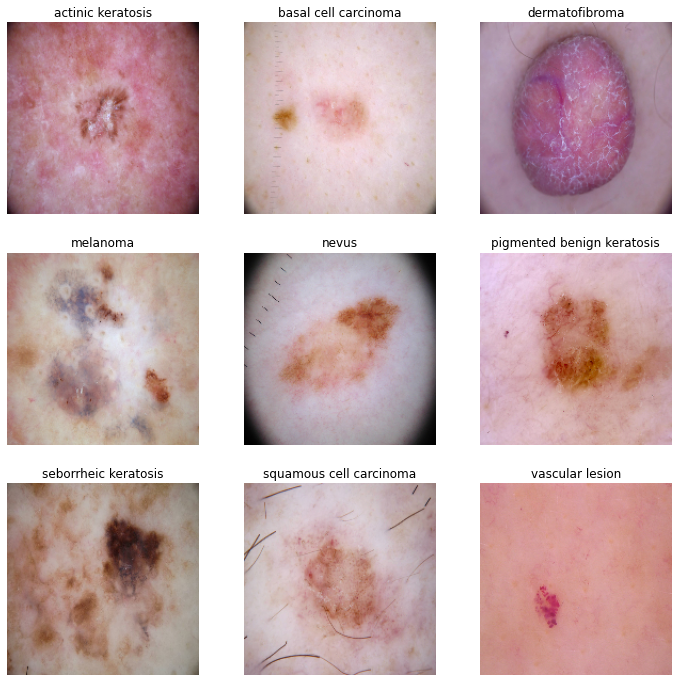

In [ ]:
import matplotlib.pyplot as plt

temp_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir_train,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

plt.figure(figsize=(12, 12))
#We filter the dataset based on each class name and plot it as part of the sub plot , this is bit tedious
for i in range(len(class_names)):
    class_filter_data_set = temp_ds.filter(lambda x, l: tf.math.equal(l[0], i))
    for image, label in class_filter_data_set.take(1):
        ax = plt.subplot(3, 3, i+1)
        plt.imshow(image[0].numpy().astype('uint8'))
        plt.title(class_names[label.numpy()[0]])
        plt.axis('off')

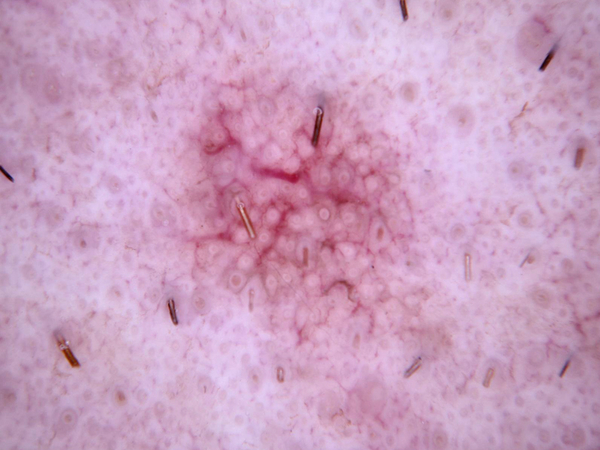

In [ ]:
temp = list(data_dir_train.glob('actinic keratosis/*'))
PIL.Image.open(str(temp[0]))


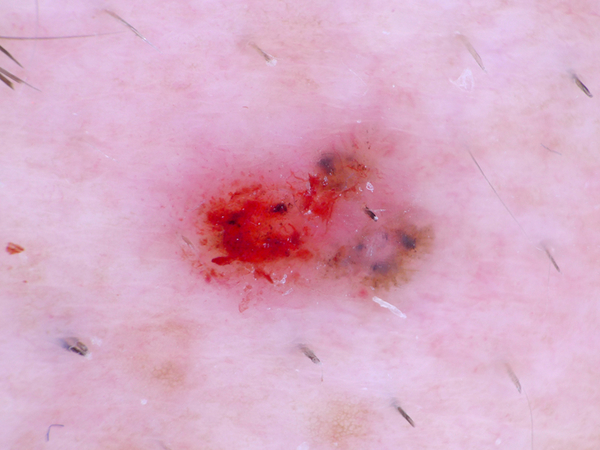

In [ ]:
temp = list(data_dir_train.glob('basal cell carcinoma/*'))
PIL.Image.open(str(temp[0]))

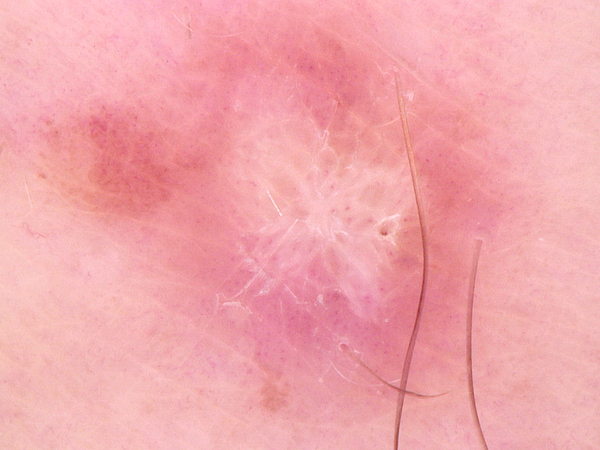

In [ ]:
temp = list(data_dir_train.glob('dermatofibroma/*'))
PIL.Image.open(str(temp[0]))

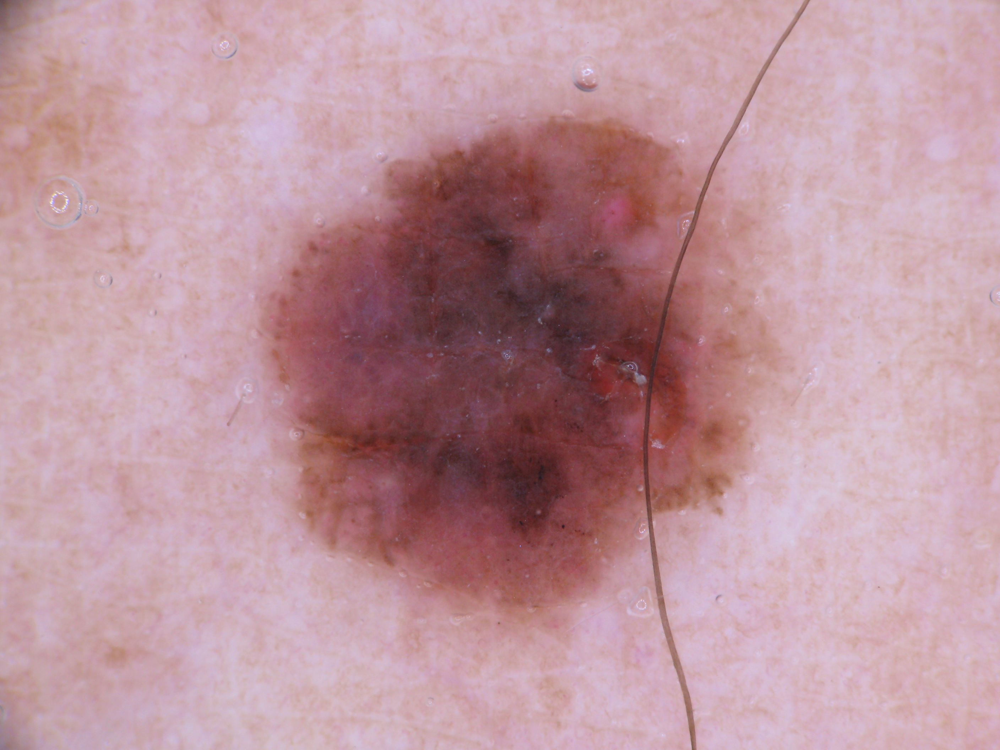

In [ ]:
temp = list(data_dir_train.glob('melanoma/*'))
PIL.Image.open(str(temp[0]))


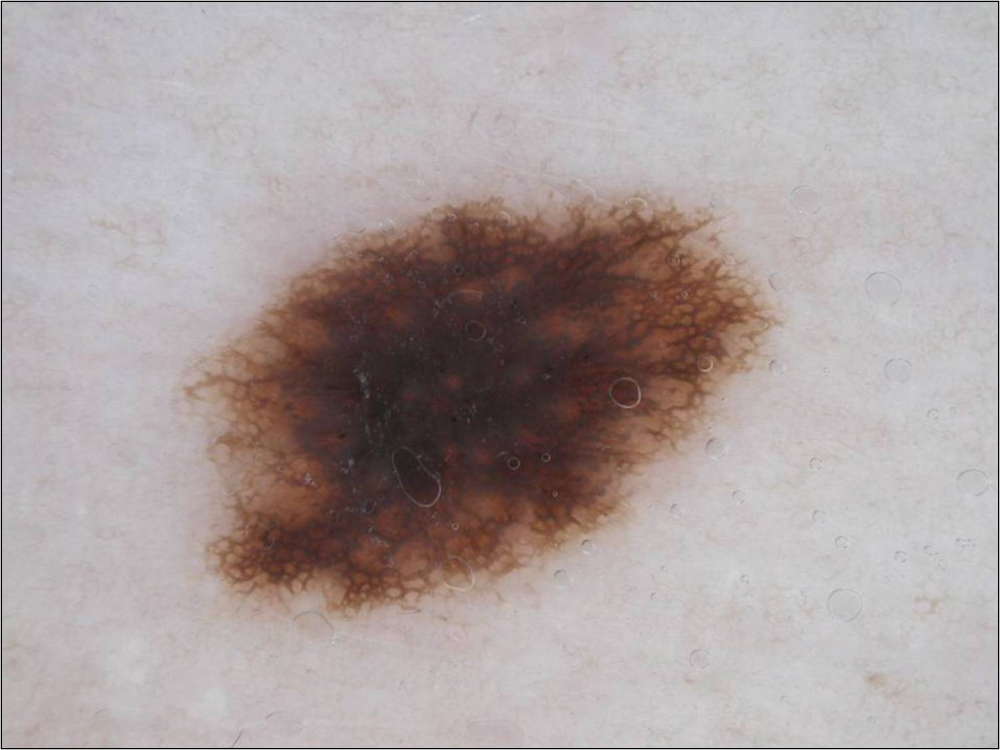

In [ ]:
temp = list(data_dir_train.glob('nevus/*'))
PIL.Image.open(str(temp[0]))

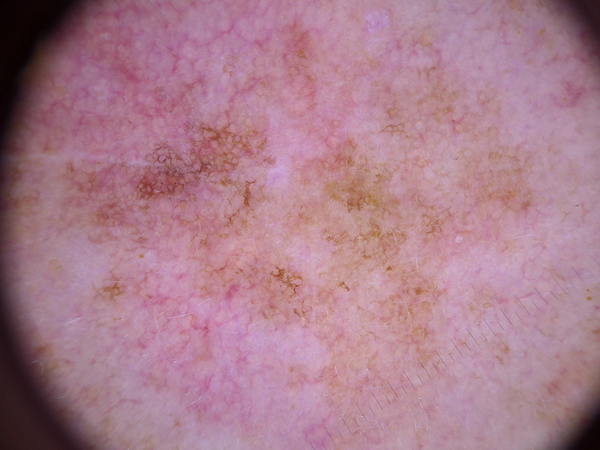

In [ ]:

temp = list(data_dir_train.glob('pigmented benign keratosis/*'))
PIL.Image.open(str(temp[0]))

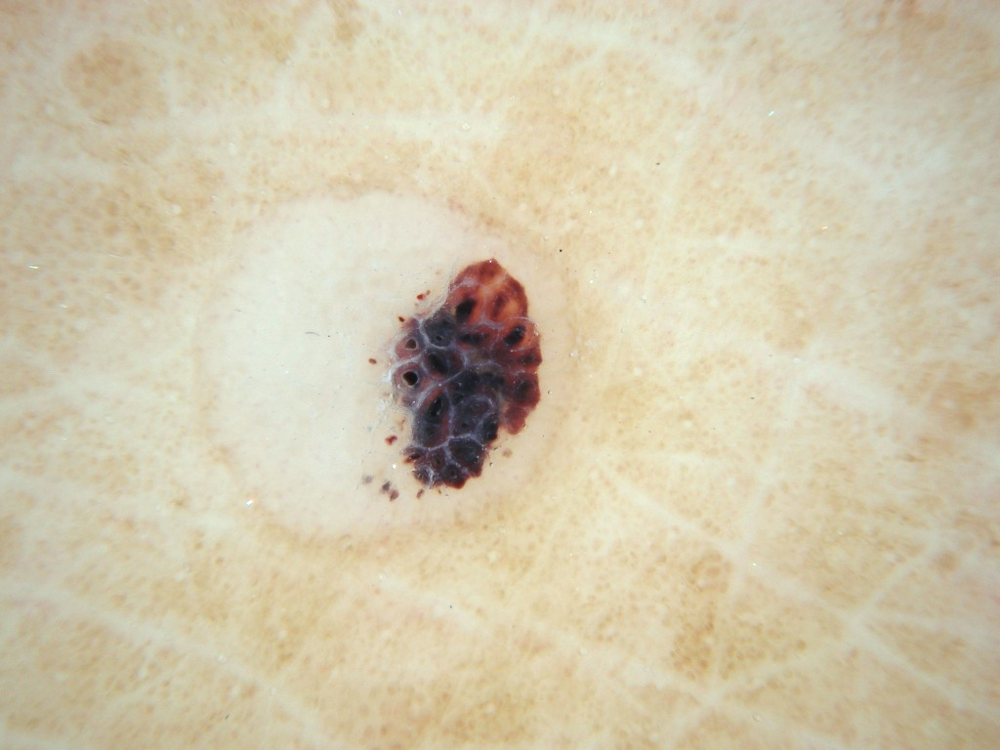

In [ ]:

temp = list(data_dir_train.glob('seborrheic keratosis/*'))
PIL.Image.open(str(temp[0]))

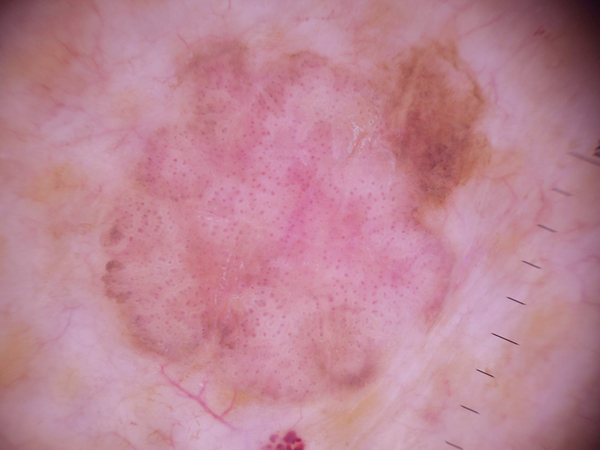

In [ ]:

temp = list(data_dir_train.glob('squamous cell carcinoma/*'))
PIL.Image.open(str(temp[0]))

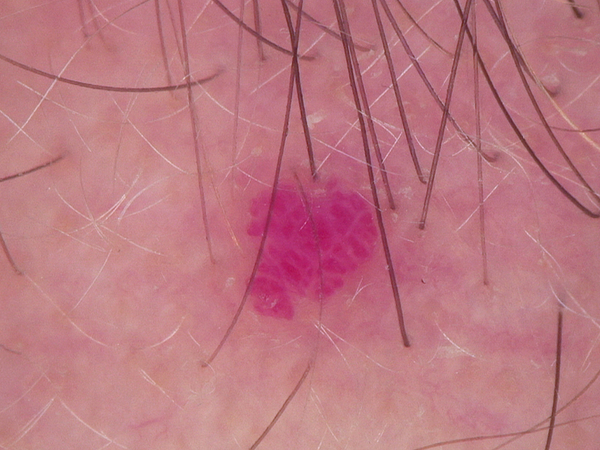

In [ ]:
temp = list(data_dir_train.glob('vascular lesion/*'))
PIL.Image.open(str(temp[0]))

The `image_batch` is a tensor of the shape `(32, 180, 180, 3)`. This is a batch of 32 images of shape `180x180x3` (the last dimension refers to color channels RGB). The `label_batch` is a tensor of the shape `(32,)`, these are corresponding labels to the 32 images.

`Dataset.cache()` keeps the images in memory after they're loaded off disk during the first epoch.

`Dataset.prefetch()` overlaps data preprocessing and model execution while training.

In [ ]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

### Create the model
#### Todo: Create a CNN model, which can accurately detect 9 classes present in the dataset. Use ```layers.experimental.preprocessing.Rescaling``` to normalize pixel values between (0,1). The RGB channel values are in the `[0, 255]` range. This is not ideal for a neural network. Here, it is good to standardize values to be in the `[0, 1]`

In [ ]:
### Your code goes here
input_shape = (180,180,3)
lr = 1e-5
init = 'normal'
activ = 'relu'

model = Sequential()

model.add(tf.keras.layers.experimental.preprocessing.Rescaling(1./255, input_shape=(180, 180, 3)))

model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=input_shape))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())

model.add(Dense(512, activation='relu'))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(len(class_names)))
model.add(Activation('softmax'))

## Number of classes is 9
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 180, 180, 3)       0         
                                                                 
 module_wrapper (ModuleWrapp  (None, 178, 178, 32)     896       
 er)                                                             
                                                                 
 module_wrapper_1 (ModuleWra  (None, 89, 89, 32)       0         
 pper)                                                           
                                                                 
 module_wrapper_2 (ModuleWra  (None, 89, 89, 32)       0         
 pper)                                                           
                                                                 
 module_wrapper_3 (ModuleWra  (None, 87, 87, 64)       18496     
 pper)                                                  

### Compile the model
Choose an appropirate optimiser and loss function for model training

In [ ]:
### Todo, choose an appropirate optimiser and loss function
model.compile(loss='categorical_crossentropy',
              optimizer='sgd',
              metrics=['accuracy'])

In [ ]:
# View the summary of all layers
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 180, 180, 3)       0         
                                                                 
 module_wrapper (ModuleWrapp  (None, 178, 178, 32)     896       
 er)                                                             
                                                                 
 module_wrapper_1 (ModuleWra  (None, 89, 89, 32)       0         
 pper)                                                           
                                                                 
 module_wrapper_2 (ModuleWra  (None, 89, 89, 32)       0         
 pper)                                                           
                                                                 
 module_wrapper_3 (ModuleWra  (None, 87, 87, 64)       18496     
 pper)                                                  

### Train the model

In [ ]:
epochs = 20
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
56/56 [==============================] - 105s 1s/step - loss: 2.0632 - accuracy: 0.2020 - val_loss: 2.1358 - val_accuracy: 0.2438
Epoch 2/20
56/56 [==============================] - 2s 39ms/step - loss: 2.0198 - accuracy: 0.2282 - val_loss: 2.1208 - val_accuracy: 0.2617
Epoch 3/20
56/56 [==============================] - 2s 39ms/step - loss: 1.9902 - accuracy: 0.2718 - val_loss: 2.0696 - val_accuracy: 0.2841
Epoch 4/20
56/56 [==============================] - 2s 39ms/step - loss: 1.9494 - accuracy: 0.2723 - val_loss: 2.0692 - val_accuracy: 0.2953
Epoch 5/20
56/56 [==============================] - 2s 39ms/step - loss: 1.9238 - accuracy: 0.2952 - val_loss: 1.9900 - val_accuracy: 0.3266
Epoch 6/20
56/56 [==============================] - 2s 39ms/step - loss: 1.9050 - accuracy: 0.3036 - val_loss: 2.0410 - val_accuracy: 0.3199
Epoch 7/20
56/56 [==============================] - 2s 39ms/step - loss: 1.8588 - accuracy: 0.3304 - val_loss: 1.9147 - val_accuracy: 0.3803
Epoch 8/20
56

### Visualizing training results

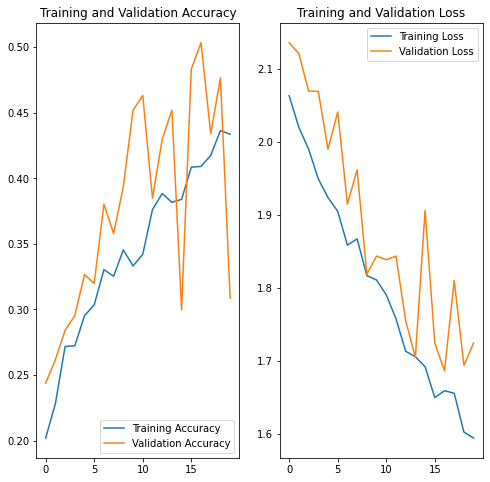

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

### Write your findings here

## We have used Conv2D+Pool (3 times) and 2 Desnse layers with out any Regulization. Baaed on visulaized results on trainng for 20 epoch we see that the train_loss and val_loss conerge at 17 epoch and then diverge, indicating a case of overfitting.

In [ ]:
from tensorflow.python.keras.layers.preprocessing.image_preprocessing import HORIZONTAL_AND_VERTICAL
# Todo, after you have analysed the model fit history for presence of underfit or overfit, choose an appropriate data augumentation strategy.
# Your code goes here
data_augmentation = Sequential(
    tf.keras.layers.RandomFlip( mode=HORIZONTAL_AND_VERTICAL,input_shape=(180, 180, 3)),
    tf.keras.layers.RandomRotation(0.2,input_shape=(180, 180, 3)),
)

data_augmentation.summary()


Model: "<keras.layers.preprocessing.image_preprocessing.RandomRotation object at 0x7f607cc3f850>"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_flip_7 (RandomFlip)  (None, 180, 180, 3)       0         
                                                                 
Total params: 0
Trainable params: 0
Non-trainable params: 0
_________________________________________________________________


### Todo:
### Create the model, compile and train the model


In [ ]:
## You can use Dropout layer if there is an evidence of overfitting in your findings

### Your code goes here
input_shape = (180,180,3)
lr = 1e-5
init = 'normal'
activ = 'relu'

model = Sequential()

model.add(tf.keras.layers.experimental.preprocessing.Rescaling(1./255, input_shape=(180, 180, 3)))

#Data Augmentaton
model.add(tf.keras.layers.RandomFlip( mode=HORIZONTAL_AND_VERTICAL))
model.add(tf.keras.layers.RandomRotation(0.2))

model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=input_shape))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())

model.add(Dense(512, activation='relu'))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(len(class_names)))
model.add(Activation('softmax'))

## Number of classes is 9
model.summary()




Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_5 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 random_flip_9 (RandomFlip)  (None, 180, 180, 3)       0         
                                                                 
 random_rotation_8 (RandomRo  (None, 180, 180, 3)      0         
 tation)                                                         
                                                                 
 module_wrapper_30 (ModuleWr  (None, 178, 178, 32)     896       
 apper)                                                          
                                                                 
 module_wrapper_31 (ModuleWr  (None, 89, 89, 32)       0         
 apper)                                                          
                                                      

### Compiling the model

In [ ]:
## Your code goes here

model.compile(loss='categorical_crossentropy',
              optimizer='sgd',
              metrics=['accuracy'])

### Training the model

In [ ]:
## Your code goes here, note: train your model for 20 epochs
epochs = 20
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/20
56/56 [==============================] - 3s 45ms/step - loss: 2.0738 - accuracy: 0.1914 - val_loss: 2.1220 - val_accuracy: 0.1812
Epoch 2/20
56/56 [==============================] - 2s 41ms/step - loss: 2.0266 - accuracy: 0.2182 - val_loss: 2.1164 - val_accuracy: 0.3356
Epoch 3/20
56/56 [==============================] - 2s 41ms/step - loss: 2.0115 - accuracy: 0.2388 - val_loss: 2.1012 - val_accuracy: 0.3512
Epoch 4/20
56/56 [==============================] - 2s 41ms/step - loss: 1.9849 - accuracy: 0.2522 - val_loss: 2.0401 - val_accuracy: 0.3087
Epoch 5/20
56/56 [==============================] - 2s 41ms/step - loss: 1.9377 - accuracy: 0.2952 - val_loss: 2.0028 - val_accuracy: 0.2841
Epoch 6/20
56/56 [==============================] - 2s 41ms/step - loss: 1.9008 - accuracy: 0.2997 - val_loss: 1.9085 - val_accuracy: 0.4049
Epoch 7/20
56/56 [==============================] - 2s 41ms/step - loss: 1.8774 - accuracy: 0.3348 - val_loss: 1.8659 - val_accuracy: 0.3758
Epoch 8/20
56

### Visualizing the results

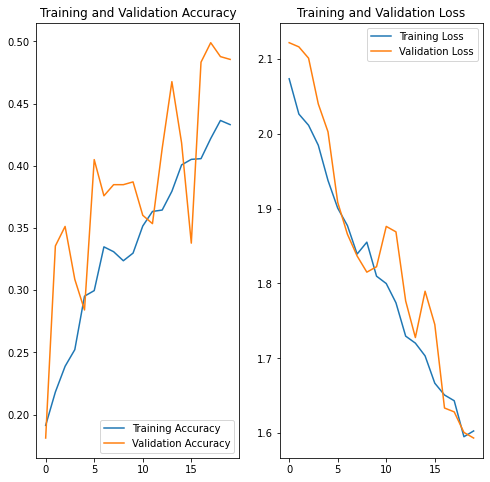

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

#### Todo: Write your findings after the model fit, see if there is an evidence of model overfit or underfit. Do you think there is some improvement now as compared to the previous model run?



As we see that upon application of RandomFlip and Random Rotation , the validation loss and training loss coverge much earlier and also we dont see really case of overfit and there cosiderable redcution of gap between training accuracy and validation acuuracy. All these indicate that model is not over fitting.

#### **Todo:** Find the distribution of classes in the training dataset.
#### **Context:** Many times real life datasets can have class imbalance, one class can have proportionately higher number of samples compared to the others. Class imbalance can have a detrimental effect on the final model quality. Hence as a sanity check it becomes important to check what is the distribution of classes in the data.

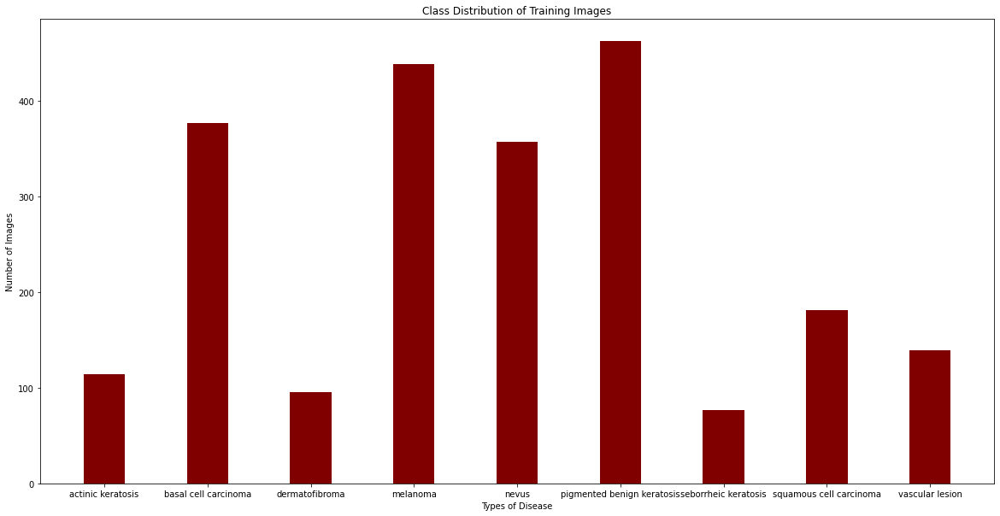

In [ ]:
## Your code goes here.

#Bar Graph to show class distribution

classnamelist = list()
classsizelist = list()

for i in class_names:
  image_count = len(list(data_dir_train.glob(i+'/*.jpg')))
  classnamelist.append(i);
  classsizelist.append(image_count)

fig = plt.figure(figsize = (20, 10))

# creating the bar plot
plt.bar(classnamelist, classsizelist, color ='maroon',
        width = 0.4)

plt.xlabel("Types of Disease")
plt.ylabel("Number of Images")
plt.title("Class Distribution of Training Images")
plt.show()

#### **Todo:** Write your findings here:
#### - class with the least number of samples?
#### - **seborrheic keratosis**
#### - classes that dominate the data in terms proportionate number of samples?
#### - **melanoma and pigmented benign keratosis**

#### **Todo:** Rectify the class imbalance
#### **Context:** You can use a python package known as `Augmentor` (https://augmentor.readthedocs.io/en/master/) to add more samples across all classes so that none of the classes have very few samples.

In [ ]:
!pip install Augmentor

To use `Augmentor`, the following general procedure is followed:

1. Instantiate a `Pipeline` object pointing to a directory containing your initial image data set.<br>
2. Define a number of operations to perform on this data set using your `Pipeline` object.<br>
3. Execute these operations by calling the `Pipeline’s` `sample()` method.


In [ ]:
path_to_training_dataset='/content/gdrive/MyDrive/data/CNN_assignment/ISIC/Train/'
import Augmentor
for i in class_names:
    p = Augmentor.Pipeline(path_to_training_dataset + i)
    p.rotate(probability=0.7, max_left_rotation=10, max_right_rotation=10)
    p.sample(500) ## We are adding 500 samples per class to make sure that none of the classes are sparse.

Initialised with 114 image(s) found.
Output directory set to /content/gdrive/MyDrive/data/CNN_assignment/ISIC/Train/actinic keratosis/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7F5FDE4571D0>: 100%|██████████| 500/500 [00:18<00:00, 27.30 Samples/s]


Initialised with 376 image(s) found.
Output directory set to /content/gdrive/MyDrive/data/CNN_assignment/ISIC/Train/basal cell carcinoma/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7F6076234210>: 100%|██████████| 500/500 [00:18<00:00, 27.48 Samples/s]


Initialised with 95 image(s) found.
Output directory set to /content/gdrive/MyDrive/data/CNN_assignment/ISIC/Train/dermatofibroma/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7F607D59AA50>: 100%|██████████| 500/500 [00:18<00:00, 26.92 Samples/s]


Initialised with 438 image(s) found.
Output directory set to /content/gdrive/MyDrive/data/CNN_assignment/ISIC/Train/melanoma/output.

Processing <PIL.Image.Image image mode=RGB size=1024x768 at 0x7F607CE1A210>: 100%|██████████| 500/500 [01:29<00:00,  5.56 Samples/s]


Initialised with 357 image(s) found.
Output directory set to /content/gdrive/MyDrive/data/CNN_assignment/ISIC/Train/nevus/output.

Processing <PIL.Image.Image image mode=RGB size=767x576 at 0x7F607D59AA50>: 100%|██████████| 500/500 [01:22<00:00,  6.07 Samples/s]


Initialised with 462 image(s) found.
Output directory set to /content/gdrive/MyDrive/data/CNN_assignment/ISIC/Train/pigmented benign keratosis/output.

Processing <PIL.Image.Image image mode=RGB size=600x450 at 0x7F607D513E10>: 100%|██████████| 500/500 [00:17<00:00, 28.43 Samples/s]


Initialised with 77 image(s) found.
Output directory set to /content/gdrive/MyDrive/data/CNN_assignment/ISIC/Train/seborrheic keratosis/output.

Processing <PIL.Image.Image image mode=RGB size=1024x768 at 0x7F607CA3BD90>: 100%|██████████| 500/500 [00:42<00:00, 11.85 Samples/s]


Initialised with 181 image(s) found.
Output directory set to /content/gdrive/MyDrive/data/CNN_assignment/ISIC/Train/squamous cell carcinoma/output.

Processing <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=600x450 at 0x7F607611EB10>: 100%|██████████| 500/500 [00:19<00:00, 25.98 Samples/s]


Initialised with 139 image(s) found.
Output directory set to /content/gdrive/MyDrive/data/CNN_assignment/ISIC/Train/vascular lesion/output.

Processing <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=600x450 at 0x7F607CDB2250>: 100%|██████████| 500/500 [00:18<00:00, 27.67 Samples/s]


Augmentor has stored the augmented images in the output sub-directory of each of the sub-directories of skin cancer types.. Lets take a look at total count of augmented images.

In [ ]:
image_count_train = len(list(data_dir_train.glob('*/output/*.jpg')))
print(image_count_train)

4500


### Lets see the distribution of augmented data after adding new images to the original training data.

In [ ]:
path_list = [x for x in glob(os.path.join(data_dir_train, '*','output', '*.jpg'))]
path_list

['/content/gdrive/MyDrive/data/CNN_assignment/ISIC/Train/pigmented benign keratosis/output/pigmented benign keratosis_original_ISIC_0028640.jpg_1c4b555a-f315-4428-babd-5a17c7267675.jpg',
 '/content/gdrive/MyDrive/data/CNN_assignment/ISIC/Train/pigmented benign keratosis/output/pigmented benign keratosis_original_ISIC_0027850.jpg_ba7e2a1d-6fac-4b68-8b91-6bccd6a588a4.jpg',
 '/content/gdrive/MyDrive/data/CNN_assignment/ISIC/Train/pigmented benign keratosis/output/pigmented benign keratosis_original_ISIC_0026538.jpg_f6565e05-93fa-4500-83c6-333e2cae092f.jpg',
 '/content/gdrive/MyDrive/data/CNN_assignment/ISIC/Train/pigmented benign keratosis/output/pigmented benign keratosis_original_ISIC_0025083.jpg_e69a98bc-1be6-4a61-9d40-4384c358ae67.jpg',
 '/content/gdrive/MyDrive/data/CNN_assignment/ISIC/Train/pigmented benign keratosis/output/pigmented benign keratosis_original_ISIC_0027388.jpg_ce970625-85d2-4536-949b-b3a8d268f285.jpg',
 '/content/gdrive/MyDrive/data/CNN_assignment/ISIC/Train/pigmente

In [ ]:
lesion_list_new = [os.path.basename(os.path.dirname(os.path.dirname(y))) for y in glob(os.path.join(data_dir_train, '*','output', '*.jpg'))]
lesion_list_new

['pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmented benign keratosis',
 'pigmen

In [ ]:
dataframe_dict_new = dict(zip(path_list, lesion_list_new))

In [ ]:
df2 = pd.DataFrame(list(dataframe_dict_new.items()),columns = ['Path','Label'])
new_df = df2

In [ ]:
new_df['Label'].value_counts()

actinic keratosis             500
dermatofibroma                500
pigmented benign keratosis    500
seborrheic keratosis          500
melanoma                      500
basal cell carcinoma          500
squamous cell carcinoma       500
vascular lesion               500
nevus                         500
Name: Label, dtype: int64

So, now we have added 500 images to all the classes to maintain some class balance. We can add more images as we want to improve training process.

#### **Todo**: Train the model on the data created using Augmentor

In [ ]:
batch_size = 32
img_height = 180
img_width = 180

#### **Todo:** Create a training dataset

In [ ]:
data_dir_train="/content/gdrive/MyDrive/data/CNN_assignment/ISIC/Train"
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir_train,
  seed=123,
  validation_split = 0.2,
  subset =  'training',
  image_size=(img_height, img_width),
  label_mode='categorical',
  batch_size=batch_size)

Found 6739 files belonging to 9 classes.
Using 5392 files for training.


#### **Todo:** Create a validation dataset

In [ ]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir_train,
  seed=123,
  validation_split = 0.2,
  subset = 'validation',
  image_size=(img_height, img_width),
  label_mode='categorical',
  batch_size=batch_size)

Found 6739 files belonging to 9 classes.
Using 1347 files for validation.


#### **Todo:** Create your model (make sure to include normalization)

In [ ]:
## your code goes here

### Your code goes here
input_shape = (180,180,3)
lr = 1e-5
init = 'normal'
activ = 'relu'

model = Sequential()

model.add(tf.keras.layers.experimental.preprocessing.Rescaling(1./255, input_shape=(180, 180, 3)))

#Data Augmentaton
model.add(tf.keras.layers.RandomFlip( mode=HORIZONTAL_AND_VERTICAL))
model.add(tf.keras.layers.RandomRotation(0.2))

model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=input_shape))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(128, kernel_size=(3, 3), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())

model.add(Dense(512, activation='relu'))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(len(class_names)))
model.add(Activation('softmax'))

## Number of classes is 9
model.summary()


Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_7 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 random_flip_11 (RandomFlip)  (None, 180, 180, 3)      0         
                                                                 
 random_rotation_10 (RandomR  (None, 180, 180, 3)      0         
 otation)                                                        
                                                                 
 module_wrapper_60 (ModuleWr  (None, 178, 178, 32)     896       
 apper)                                                          
                                                                 
 batch_normalization_3 (Batc  (None, 178, 178, 32)     128       
 hNormalization)                                                 
                                                      

#### **Todo:** Compile your model (Choose optimizer and loss function appropriately)

In [ ]:
## your code goes here

model.compile(loss='categorical_crossentropy',
              optimizer='sgd',
              metrics=['accuracy'])

#### **Todo:**  Train your model

In [ ]:
epochs = 30
## Your code goes here, note: train your model for 20 epochs
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/30
169/169 [==============================] - 34s 187ms/step - loss: 2.4529 - accuracy: 0.2977 - val_loss: 7.9970 - val_accuracy: 0.0831
Epoch 2/30
169/169 [==============================] - 33s 192ms/step - loss: 1.6607 - accuracy: 0.3731 - val_loss: 6.5002 - val_accuracy: 0.1663
Epoch 3/30
169/169 [==============================] - 32s 182ms/step - loss: 1.5665 - accuracy: 0.4095 - val_loss: 2.8269 - val_accuracy: 0.3400
Epoch 4/30
169/169 [==============================] - 32s 182ms/step - loss: 1.5249 - accuracy: 0.4238 - val_loss: 3.5346 - val_accuracy: 0.2339
Epoch 5/30
169/169 [==============================] - 32s 182ms/step - loss: 1.4821 - accuracy: 0.4347 - val_loss: 3.3365 - val_accuracy: 0.3289
Epoch 6/30
169/169 [==============================] - 32s 182ms/step - loss: 1.4454 - accuracy: 0.4499 - val_loss: 2.5944 - val_accuracy: 0.3593
Epoch 7/30
169/169 [==============================] - 32s 183ms/step - loss: 1.4050 - accuracy: 0.4709 - val_loss: 2.3920 - val_ac

#### **Todo:**  Visualize the model results

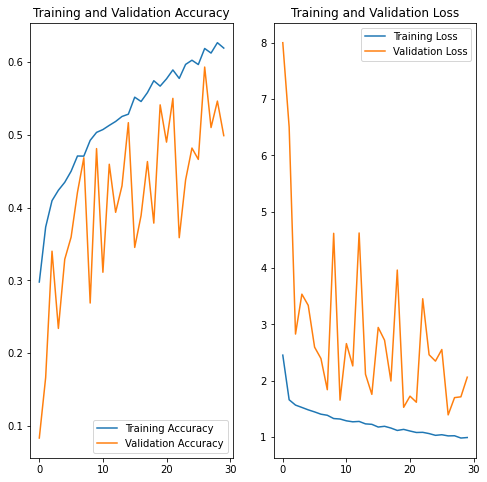

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

#### **Todo:**  Analyze your results here. Did you get rid of underfitting/overfitting? Did class rebalance help?



**We dont see a over fitting or underfitting model. As the number the of epochs increased there was stright increase in accuracacy and and loss margin being minimal between the trainingloss and validation loss. Class rebalance helped in the reduction as of overfitting.**